In [52]:
import sys
import xarray as xr
import torch
import random
import numpy as np
import torchinfo
import importlib as imp
import pandas as pd
import warnings

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import cartopy as ct
import cmasher as cmr
import cartopy.feature as cfeature
import regionmask

import warnings

warnings.filterwarnings("ignore")

import utils
import datamaker.data_loader as data_loader
from datamaker.data_generator import ClimateData
import datamaker.regions as regions
from trainer.trainer import Trainer
from model.model import TorchModel
import model.loss as module_loss
import model.metric as module_metric
import visuals.plots as plots
from shash.shash_torch import Shash

print(f"python version = {sys.version}")
print(f"numpy version = {np.__version__}")
print(f"xarray version = {xr.__version__}")
print(f"pytorch version = {torch.__version__}")

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

python version = 3.11.6 | packaged by conda-forge | (main, Oct  3 2023, 10:37:07) [Clang 15.0.7 ]
numpy version = 1.24.4
xarray version = 2023.6.0
pytorch version = 2.4.1


In [53]:
config = utils.get_config("exp905")
seed = config["seed_list"][1]

In [54]:
# Load the data; split into train, val, test
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True

print("getting data ...")
data = ClimateData(
    config["datamaker"],
    expname=config["expname"],
    seed=seed,
    data_dir=config["data_dir"],
    figure_dir=config["figure_dir"],
    verbose=False,
)

trainset = data_loader.CustomData(data.d_train)
valset = data_loader.CustomData(data.d_val)
testset = data_loader.CustomData(data.d_test)
obsset = data_loader.CustomData(data.d_obs)

getting data ...
YEAR REACHED:  [2001. 1998. 1990. 2000. 2014. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2007. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2012.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2009. 2002. 1994. 2004. 2014. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2007. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2012.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2026. 2017. 2017. 2004. 2016. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2028. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2017.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2036. 2037. 2048. 2022. 2058. 2029. 2034.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2038. 2035.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2038.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2100. 2083. 2100. 2

In [55]:
# Load the model
device = utils.prepare_device(config["device"])
model_name = utils.get_model_name(config["expname"], seed)
model = TorchModel(
    config=config["arch"], target=trainset.target
)  # sets up model architecture
model = utils.load_torch_model(
    model, config["model_dir"] + model_name + ".pt"
)  # loads model weights from file
model.to(device)  # sends model to GPU or CPU
print(f"loaded_model = {model_name}")

loaded_model = exp905_seed10


In [56]:
# Make predictions for train/val/test for GCM data
with torch.inference_mode():  # inference mode disables gradient calculations for efficiency
    data.d_train["output"] = model.predict(
        dataset=trainset, batch_size=128, device=device
    )
    data.d_val["output"] = model.predict(dataset=valset, batch_size=128, device=device)
    data.d_test["output"] = model.predict(
        dataset=testset, batch_size=128, device=device
    )

data.d_train["output_median"] = Shash(data.d_train["output"]).median().numpy()
data.d_val["output_median"] = Shash(data.d_val["output"]).median().numpy()
data.d_test["output_median"] = Shash(data.d_test["output"]).median().numpy()
data.d_train["output_mode"] = Shash(data.d_train["output"]).mean().numpy()
data.d_val["output_mode"] = Shash(data.d_val["output"]).mode().numpy()
data.d_test["output_mode"] = Shash(data.d_test["output"]).mode().numpy()
# The data.d_train["output"] is a 4D array with the SHASH parameters

In [57]:
# Make predictions for obs

with torch.inference_mode():
    data.d_obs["output"] = model.predict(dataset=obsset, batch_size=128, device=device)

data.d_obs["output_median"] = Shash(data.d_obs["output"]).median().numpy()
data.d_obs["output_lbar"] = Shash(data.d_obs["output"]).quantile(0.25).numpy()
data.d_obs["output_hbar"] = Shash(data.d_obs["output"]).quantile(0.75).numpy()

data.d_obs["output_mode"] = Shash(data.d_obs["output"]).mode().numpy()
data.d_obs["output_mode_lbar"] = Shash(data.d_obs["output"]).quantile(0.25).numpy()
data.d_obs["output_mode_hbar"] = Shash(data.d_obs["output"]).quantile(0.75).numpy()

In [58]:
data.d_obs["output"]

array([[ 1.1042469e+01,  7.7504082e+00, -1.0048151e-03,  1.0000000e+00],
       [ 9.9296150e+00,  8.7404318e+00,  4.0857792e-03,  1.0000000e+00],
       [ 8.9139347e+00,  8.2691889e+00,  4.7955066e-02,  1.0000000e+00],
       ...,
       [ 2.7126266e+01,  7.9831381e+00,  1.2202704e-01,  1.0000000e+00],
       [ 2.7247082e+01,  7.9298749e+00,  1.0144842e-01,  1.0000000e+00],
       [ 2.6528008e+01,  8.5993500e+00,  1.2808651e-01,  1.0000000e+00]],
      dtype=float32)

In [59]:
# Print out some years relating to "threshold is reached" metrics - median
thresh_year = data.d_obs["output_median"] + data.d_obs["year"]
print("2024- Median Year Crossed " + str(thresh_year[-1]))
print(np.mean(thresh_year))
print(np.mean(thresh_year[-5:]))
print((data.d_obs["output_lbar"] + data.d_obs["year"])[-1])
print((data.d_obs["output_hbar"] + data.d_obs["year"])[-1])

2024- Median Year Crossed 2051.6324825286865
2023.544622245522
2050.0018867492677
2046.012414932251
2057.70804977417


In [60]:
# Print out some years relating to "threshold is reached" metrics- mode
thresh_year = data.d_obs["output_mode"] + data.d_obs["year"]
print("2024- Maximum Likelihood Year Crossed " + str(thresh_year[-1]))
print(np.mean(thresh_year))
print(np.mean(thresh_year[-5:]))
print((data.d_obs["output_mode_lbar"] + data.d_obs["year"])[-1])
print((data.d_obs["output_mode_hbar"] + data.d_obs["year"])[-1])

2024- Maximum Likelihood Year Crossed 2050.545244216919
2023.4164305382842
2048.8916709899904
2046.012414932251
2057.70804977417


## Plot obs-constrained time to prediction

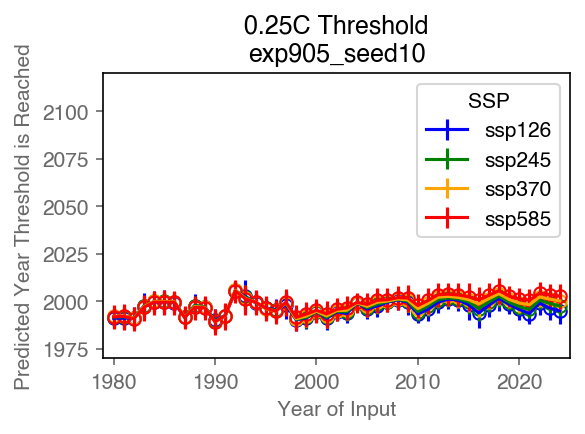

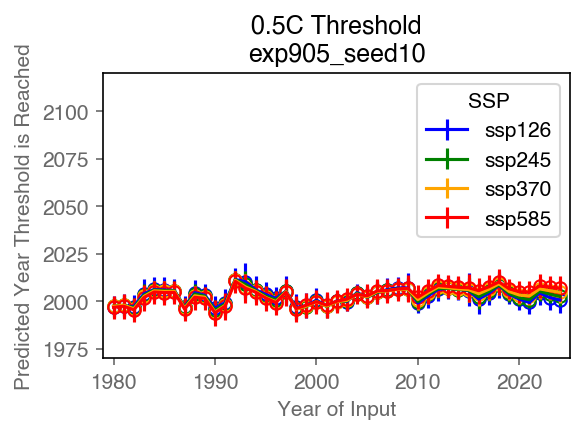

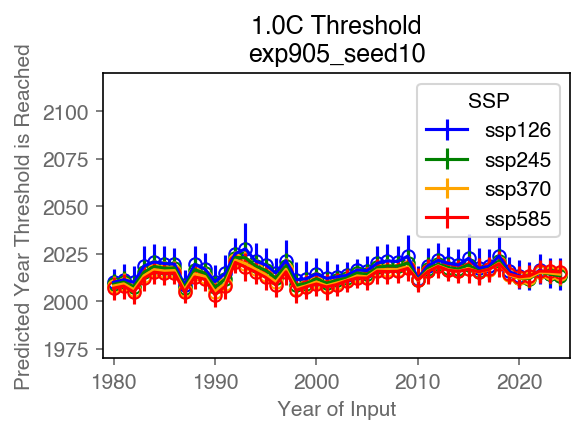

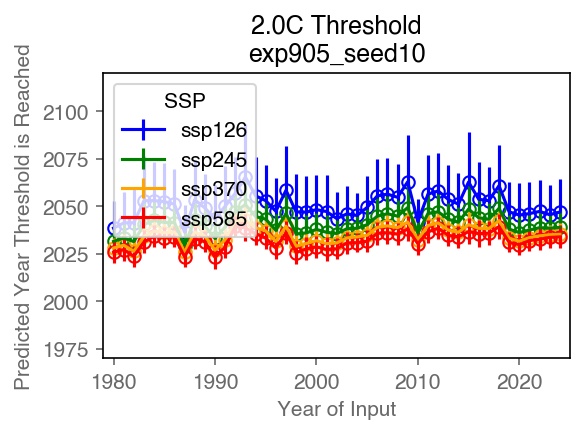

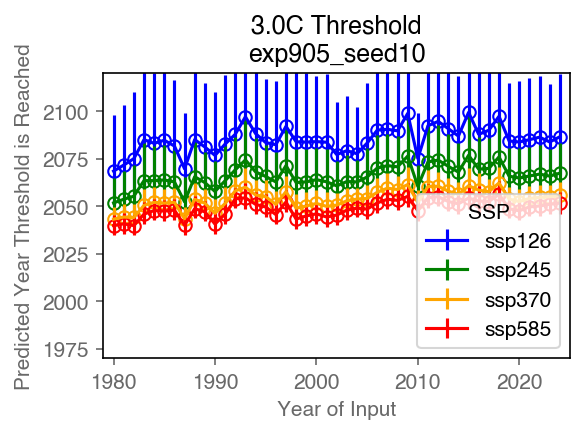

In [61]:
constraint_var = "output_median"

# Define colors for SSPs
colors = {
    "ssp126": "blue",
    "ssp245": "green",
    "ssp370": "orange",
    "ssp585": "red",
}

# Loop over temp_targets to create one plot for each
for temp_target in list(
    dict.fromkeys(data.d_obs["temp_target"])
):  # Unique temp_target values
    plt.figure(figsize=(4, 3))  # Create a new figure for each temp_target

    # Loop over SSPs to plot all lines for the current temp_target
    for ssp in list(dict.fromkeys(data.d_obs["ssp"])):  # Unique SSP values
        # Filter the dictionary to isolate data for the current SSP and temp_target
        indices = [
            i
            for i, (ssp_val, temp_tar) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp and temp_tar == temp_target
        ]

        years = [data.d_obs["year"][i] for i in indices]
        output_var = [data.d_obs[constraint_var][i] for i in indices]

        if constraint_var == "output_median":
            output_lbar = [data.d_obs["output_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_hbar"][i] for i in indices]
            error_bars = np.concatenate(
                (
                    np.array(output_var) - np.array(output_lbar)[np.newaxis, :],
                    np.array(output_hbar)[np.newaxis, :] - np.array(output_var),
                ),
                axis=0,
            )
        else:
            output_lbar = [data.d_obs["output_mode_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_mode_hbar"][i] for i in indices]
            # Compute error bars (ensure no negative values)
            lower_error = np.maximum(np.array(output_var) - np.array(output_lbar), 0)
            upper_error = np.maximum(np.array(output_hbar) - np.array(output_var), 0)

            # Make sure the error bars are in the shape of a 1D array
            error_bars = [lower_error, upper_error]

        plt.errorbar(
            years,
            np.array(output_var) + np.array(years),
            yerr=error_bars,
            color=colors[ssp],
            label=f"{ssp}",
        )

        plt.plot(
            years,
            np.array(output_var) + np.array(years),
            "o",
            markeredgecolor=colors[ssp],
            markersize=6,
            markerfacecolor="none",
            markeredgewidth=1,
        )

    plt.ylim(1970, 2120)
    plt.xlim(1979, 2025)
    plt.xlabel("Year of Input")
    plt.ylabel("Predicted Year Threshold is Reached")
    plt.title(f"{temp_target}C Threshold\n{model_name}")
    plt.legend(title="SSP", loc="best")
    plt.tight_layout()

    plt.savefig(
        f"{config['figure_dir']}analysis/{config['expname']}_temp_target_timeseries_{temp_target}_seed{seed}.png",
        dpi=300,
    )

    plt.show()

## SHASH plots with obs

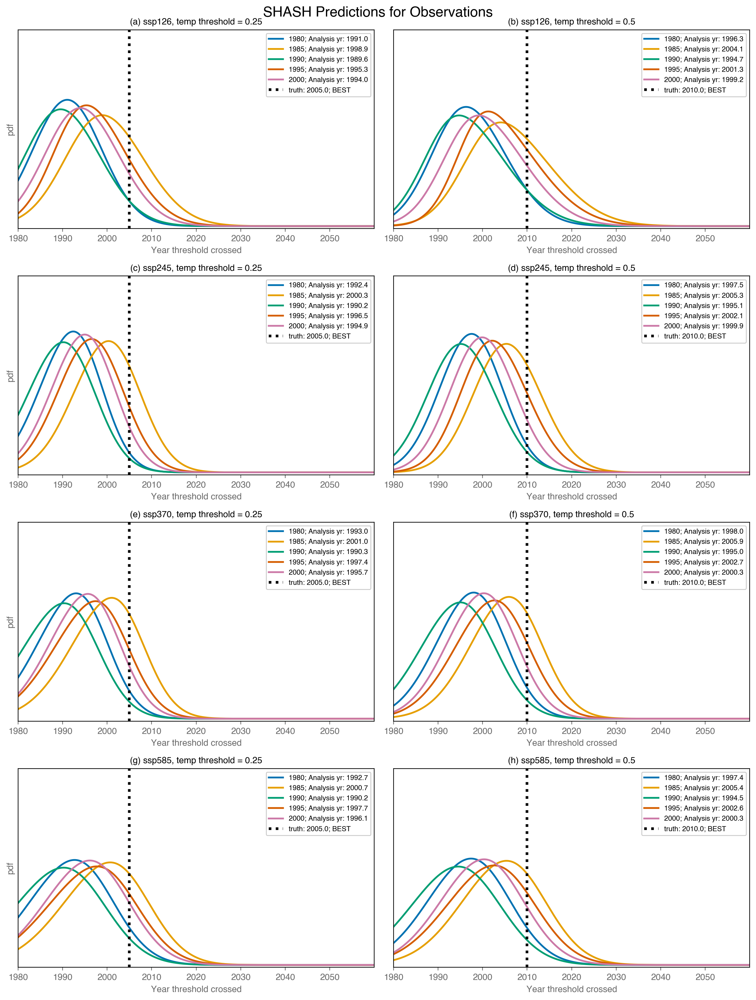

In [11]:
constraint_var = "output_mode"
# Temp targets that have been reached in OBS
temp_target_values = [0.25, 0.5]
years_of_interest = [1980, 1985, 1990, 1995, 2000]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot

x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
f, axs = plt.subplots(
    len(ssp_plot_all), len(temp_target_values), figsize=(12, 16), dpi=200
)  # SSPs x temp_target
panel_letters = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)", "(g)", "(h)"]
fontsize = 10

# Colorblind-friendly palette for years
color_palette = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        ax = axs[i, j]  # Select the correct subplot

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        if not filtered_indices:
            ax.text(
                0.5,
                0.5,
                "No data available",
                transform=ax.transAxes,
                fontsize=12,
                color="gray",
                ha="center",
                va="center",
            )
            continue

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color=color,
                    linewidth=2,
                    label=f"{year}; Analysis yr: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.1f}",
                )

        # Plot observations
        obs_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp_plot and tt == temp_target
        ]

        if obs_indices:
            obs_index = obs_indices[0]
            obs_year = data.d_obs["y"][obs_index] + data.d_obs["year"][obs_index]
            gcm_name = data.d_obs["gcm_name"][obs_index]
            ax.axvline(
                x=obs_year,
                linestyle=":",
                color="black",
                alpha=1.0,
                linewidth=3,
                label=f"truth: {obs_year}; {gcm_name}",
                zorder=2,
            )
        else:
            ax.text(
                0.5,
                0.9,
                "truth: n/a",
                transform=ax.transAxes,
                fontsize=8,
                color="gray",
                ha="center",
            )

        ax.set_title(
            panel_letters[i * 2 + j] + f" {ssp_plot}, temp threshold = {temp_target}",
            fontsize=fontsize,
            color="k",
        )

        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )
        ax.set_xlabel("Year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2060, 10))
        ax.set_xlim(1980, 2060)
        ax.set_ylim(-0.001, 0.08)

        ax.set_yticks([])
        ax.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
        ax.grid(False)

plt.suptitle("SHASH Predictions for Observations", fontsize=16)
plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_shash_obs_based_seed{seed}_priorpreds.png",
    dpi=300,
)
plt.show()

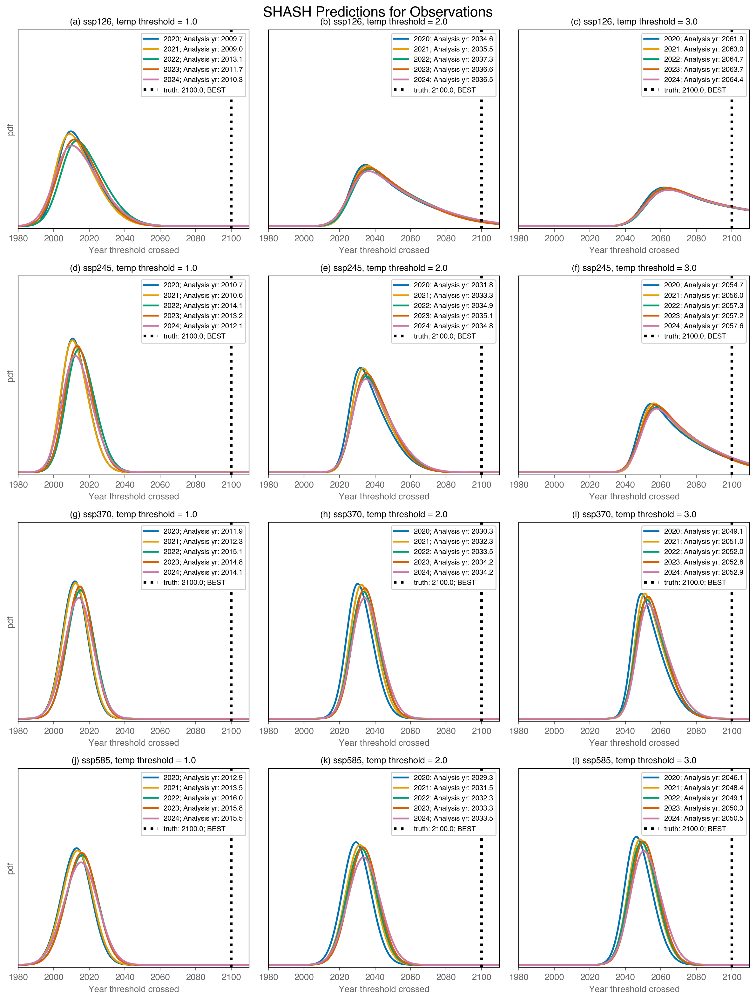

In [12]:
# Temp targets that haven't been reached in OBS
temp_target_values = [1.0, 2.0, 3.0]
years_of_interest = [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot

x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
f, axs = plt.subplots(
    len(ssp_plot_all), len(temp_target_values), figsize=(12, 16), dpi=200
)  # SSPs x temp_target
panel_letters = [
    "(a)",
    "(b)",
    "(c)",
    "(d)",
    "(e)",
    "(f)",
    "(g)",
    "(h)",
    "(i)",
    "(j)",
    "(k)",
    "(l)",
]
fontsize = 10

# Colorblind-friendly palette for years
color_palette = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        ax = axs[i, j]  # Select the correct subplot

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        if not filtered_indices:
            ax.text(
                0.5,
                0.5,
                "No data available",
                transform=ax.transAxes,
                fontsize=12,
                color="gray",
                ha="center",
                va="center",
            )
            continue

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color=color,
                    linewidth=2,
                    label=f"{year}; Analysis yr: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.1f}",
                )

        # Plot observations
        obs_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp_plot and tt == temp_target
        ]

        if obs_indices:
            obs_index = obs_indices[0]
            obs_year = data.d_obs["y"][obs_index] + data.d_obs["year"][obs_index]
            gcm_name = data.d_obs["gcm_name"][obs_index]
            ax.axvline(
                x=obs_year,
                linestyle=":",
                color="black",
                alpha=1.0,
                linewidth=3,
                label=f"truth: {obs_year}; {gcm_name}",
                zorder=2,
            )
        else:
            ax.text(
                0.5,
                0.9,
                "truth: n/a",
                transform=ax.transAxes,
                fontsize=8,
                color="gray",
                ha="center",
            )

        # Customize subplot
        ax.set_title(
            panel_letters[i * 3 + j] + f" {ssp_plot}, temp threshold = {temp_target}",
            fontsize=fontsize,
            color="k",
        )

        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )
        ax.set_xlabel("Year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_xlim(1980, 2110)
        ax.set_ylim(-0.001, 0.08)

        ax.set_yticks([])
        ax.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
        ax.grid(False)

plt.suptitle("SHASH Predictions for Observations", fontsize=16)
plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_shash_obs_based_seed{seed}_recentpreds.png",
    dpi=300,
)
plt.show()

# SHASH - GCMs only

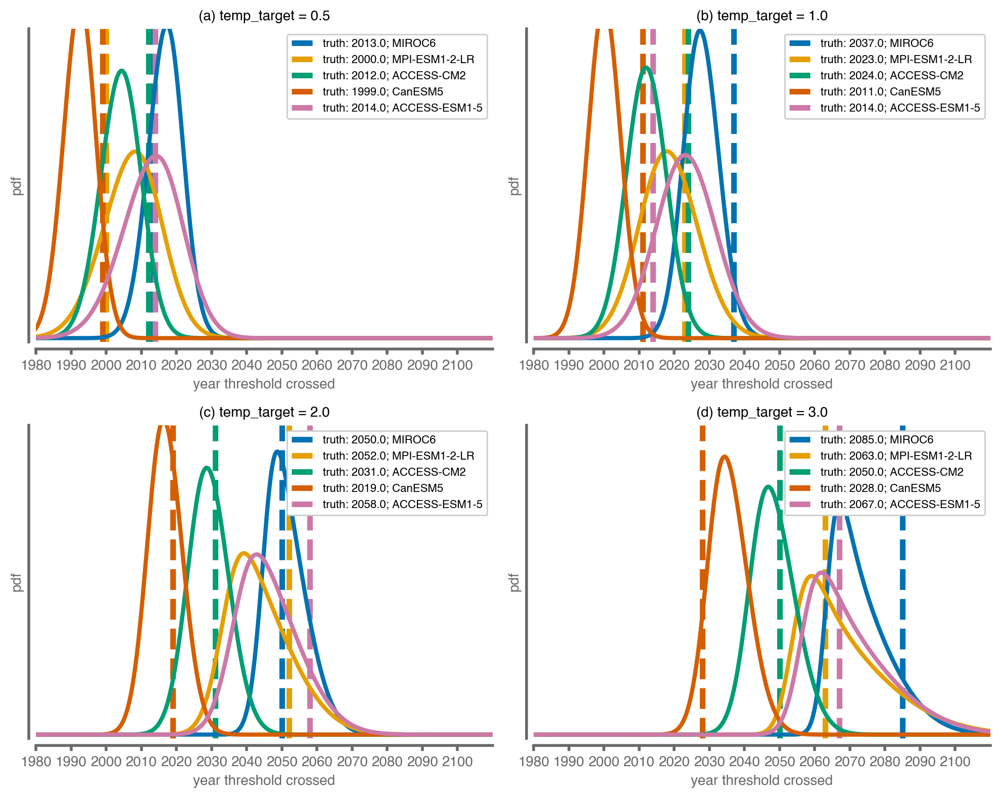

In [13]:
# SHASH plots

# Define the range of temp_target values
temp_target_values = [0.5, 1.0, 2.0, 3.0]
ssp_plot = "ssp370"
# temp_target_values = data.config["temp_targets"]

x = np.arange(-130, 130, 0.1)
f, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=200)
axs = axs.flatten()

# Colorblind-friendly palette
colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
panel_letters = ("(a)", "(b)", "(c)", "(d)")
fontsize = 10

# Loop through each temp_target value for the panel plots
for isample, temp_target in enumerate(temp_target_values):
    ax = axs[isample]

    # Filter the data based on ssp and temp_target
    filtered_indices = [
        i
        for i, (ssp, tt) in enumerate(
            zip(data.d_test["ssp"], data.d_test["temp_target"])
        )
        if ssp == ssp_plot and tt == temp_target
    ]

    # Group the filtered data by unique gcm_name and sample one instance per GCM
    unique_gcms = set(data.d_test["gcm_name"][filtered_indices])

    # Use a different color for each unique GCM
    for color, gcm in zip(colors, unique_gcms):
        # Find a sample corresponding to the current GCM
        gcm_indices = [i for i in filtered_indices if data.d_test["gcm_name"][i] == gcm]
        sample = gcm_indices[
            45
        ]  # Select a sample corresponding to this GCM - this can be updated to a storyline selection; 44 used for predictions made in 2023

        # Plot the truth as a vertical line
        truth_year = data.d_test["y"][sample] + data.d_test["year"][sample]
        ax.axvline(
            x=truth_year,
            linestyle="--",
            color=color,
            alpha=1.0,
            linewidth=4,
            label=f"truth: {truth_year}; {gcm}",
            zorder=0,
        )

        # Plot the SHASH distribution
        dist = Shash(data.d_test["output"][sample : sample + 1, :])
        p = dist.prob(x).numpy()
        ax.plot(
            x + data.d_test["year"][sample],
            p,
            zorder=1,
            color=color,
            linewidth=3,
        )

    ax.set_title(
        panel_letters[isample] + f" temp_target = {temp_target}",
        fontsize=fontsize,
        color="k",
    )

    ax.legend(fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1)

    ax.set_xlabel("year threshold crossed", fontsize=fontsize)
    ax.set_xticks(np.arange(1980, 2110, 10))
    ax.set_yticks(np.arange(0, 0.22, 0.02).round(2))
    ax.set_xlim(1980, 2110)
    ax.set_ylim(-0.001, 0.08)
    plots.format_spines(ax)

    ax.set_yticks([])
    ax.set_ylabel("pdf")
    ax.grid(False)

plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_shash_gcm_{ssp}_seed{seed}.png",
    dpi=300,
)

plt.show()

In [14]:
unique_gcms

{'ACCESS-CM2', 'ACCESS-ESM1-5', 'CanESM5', 'MIROC6', 'MPI-ESM1-2-LR'}

In [15]:
# Define the range of temp_target values
temp_target_values = [0.25, 0.5, 1.0, 2.0, 3.0]  # config["datamaker"]["temp_targets"] #
ssps = ["ssp126", "ssp245", "ssp370", "ssp585"]

x = np.arange(-130, 130, 0.1)

# Create a 4x4 grid (4 SSPS x 4 temp_target values)
fig, axs = plt.subplots(
    4, (len(temp_target_values)), figsize=(16, 16), dpi=600
)  # 4 rows, 4 columns
axs = axs.flatten()

# Colorblind-friendly palette
colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
fontsize = 10

# Loop through each ssp and temp_target combination for the panel plots
for i, ssp in enumerate(ssps):
    for j, temp_target in enumerate(temp_target_values):
        ax = axs[i * 5 + j]  # Set the position for the subplot

        # Filter the data based on ssp and temp_target
        filtered_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_test["ssp"], data.d_test["temp_target"])
            )
            if ssp_val == ssp and tt == temp_target
        ]

        # Group the filtered data by unique gcm_name and sample one instance per GCM
        unique_gcms = set(data.d_test["gcm_name"][filtered_indices])

        # Use a different color for each unique GCM
        for color, gcm in zip(colors, unique_gcms):
            # Find a sample corresponding to the current GCM
            gcm_indices = [
                k for k in filtered_indices if data.d_test["gcm_name"][k] == gcm
            ]
            sample = gcm_indices[
                45
            ]  # 44 to correpsond with predictions made in 2023; 45 for 2024

            # Plot the truth as a vertical line
            truth_year = data.d_test["y"][sample] + data.d_test["year"][sample]
            ax.axvline(
                x=truth_year,
                linestyle="--",
                color=color,
                alpha=1.0,
                linewidth=4,
                label=f"truth: {truth_year}; {gcm}",
                zorder=0,
            )

            # Plot the SHASH distribution
            dist = Shash(data.d_test["output"][sample : sample + 1, :])
            p = dist.prob(x).numpy()
            ax.plot(
                x + data.d_test["year"][sample],
                p,
                zorder=1,
                color=color,
                linewidth=3,
            )

        ax.set_title(
            f"{ssp} - temp_target = {temp_target}", fontsize=fontsize, color="k"
        )

        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )

        ax.set_xlabel("year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_yticks(np.arange(0, 0.22, 0.02).round(2))
        ax.set_xlim(1980, 2110)
        ax.set_ylim(-0.001, 0.08)
        plots.format_spines(ax)

        ax.set_yticks([])
        ax.set_ylabel("pdf")
        ax.grid(False)

plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_shash_gcm_based_all_ssps_seed{seed}.png",
    dpi=300,
)
plt.show()

In [16]:
unique_gcms

{'ACCESS-CM2', 'ACCESS-ESM1-5', 'CanESM5', 'MIROC6', 'MPI-ESM1-2-LR'}

In [17]:
data_all = {
    key: np.concatenate([data.d_train[key], data.d_val[key], data.d_test[key]])
    for key in data.d_train.keys()
}

# Define temp target values and SSPs
temp_target_values = [0.5, 1.0, 2.0, 3.0]
ssps = ["ssp126", "ssp245", "ssp370", "ssp585"]
member = 8

# Create a 4-row subplot layout (one per SSP)
fig, axs = plt.subplots(len(ssps), 1, figsize=(12, 16), dpi=600, sharex=True)

# Colorblind-friendly palette
colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00"]
fontsize = 12

# Loop through each SSP
for i, ssp in enumerate(ssps):
    ax = axs[i]

    # Filter data for the current SSP
    ssp_mask = data_all["ssp"] == ssp
    filtered_indices = np.where(ssp_mask)[0]

    # Get the unique GCM name and select one
    unique_gcms = list(set(data_all["gcm_name"][filtered_indices]))
    if not unique_gcms:
        continue  # Skip if no GCM data available
    selected_gcm = unique_gcms[3]  # pick which of the 5 GCMs to plot

    # Further filter for the selected GCM
    member_mask = data_all["member"] == member
    gcm_mask = ssp_mask & member_mask & (data_all["gcm_name"] == selected_gcm)
    years = data_all["year"][gcm_mask][0:121]
    temps = data_all["current_temp"][gcm_mask][0:121]

    # Plot the temperature time series
    ax.plot(
        years,
        temps,
        color=colors[i],
        linewidth=1.5,
        alpha=0.7,
        label=f"{ssp} - {selected_gcm}",
    )

    # Plot a thin black horizontal line at y=0
    ax.axhline(y=0, color="black", linestyle="-", linewidth=0.8)

    # Plot horizontal dashed lines for each temp target
    for temp_target in temp_target_values:
        ax.axhline(y=temp_target, color="gray", linestyle=(0, (3, 3)), linewidth=1)

    # Plot vertical black lines for the year each temp target was reached
    for temp_target in temp_target_values:
        target_mask = gcm_mask & (data_all["temp_target"] == temp_target)
        if np.any(target_mask):
            year_reached = data_all["year_reached"][target_mask][0]

            # Thicker black vertical line
            ax.axvline(x=year_reached, linestyle="--", color="black", linewidth=2)

            # Adjust text positioning to avoid overlap
            text_ypos = ax.get_ylim()[0]  # - 3  # Move text slightly up
            text_xpos = year_reached + 0.6  # Shift text slightly to the right

            ax.text(
                text_xpos,
                text_ypos,
                f"{temp_target}°C in {year_reached}",
                rotation=90,
                verticalalignment="bottom",
                horizontalalignment="left",
                fontsize=10,
                color="black",
                fontweight="bold",
            )

    ax.set_title(
        f"SSP: {ssp} | GCM: {selected_gcm} ens #{member}", fontsize=fontsize, color="k"
    )
    ax.set_ylabel("Temperature (°C)", fontsize=fontsize)
    # ax.legend(fontsize=10, loc="upper left")
    ax.grid(True, linestyle=":", alpha=0.5)

# Set common x-label and x-ticks for all subplots
axs[-1].set_xlabel("Year", fontsize=fontsize)
axs[-1].set_xticks(np.arange(1980, 2110, 20))

plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_yr_reached_{selected_gcm}_ens{member}_seed{seed}.png",
    dpi=300,
)
plt.show()

## Plot Observations Crossing Thresholds

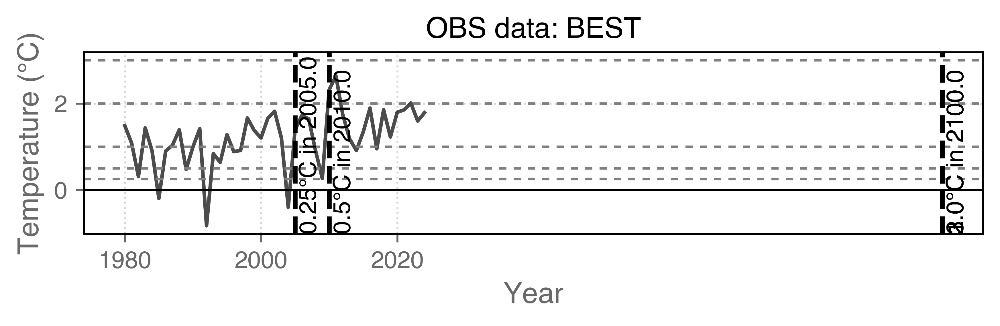

In [19]:
# Define temp target values and SSPs
temp_target_values = config["datamaker"][
    "temp_targets"
]  # [0.5, 1.0, 2.0, 3.0, 4.0, 5.0]
ssps = ["ssp126"]
member = 0

# Create a 4-row subplot layout (one per SSP)
fig, ax = plt.subplots(1, 1, figsize=(6, 2), dpi=600, sharex=True)

# Colorblind-friendly palette
colors = ["black"]
fontsize = 12

# Loop through each SSP
for i, ssp in enumerate(ssps):
    # ax = axs[i]

    # Filter data for the current SSP
    ssp_mask = data.d_obs["ssp"] == ssp
    filtered_indices = np.where(ssp_mask)[0]

    # Get the unique GCM name and select one
    unique_gcms = list(set(data.d_obs["gcm_name"][filtered_indices]))
    if not unique_gcms:
        continue  # Skip if no GCM data available
    selected_gcm = unique_gcms[0]  # pick which of the 5 GCMs to plot

    # Further filter for the selected GCM
    member_mask = data.d_obs["member"] == member
    gcm_mask = ssp_mask & member_mask & (data.d_obs["gcm_name"] == selected_gcm)
    years = data.d_obs["year"][gcm_mask][0:45]
    temps = data.d_obs["current_temp"][gcm_mask][0:45]

    # Plot the temperature time series
    ax.plot(
        years,
        temps,
        color=colors[i],
        linewidth=1.5,
        alpha=0.7,
        label=f"{ssp} - {selected_gcm}",
    )

    # Plot a thin black horizontal line at y=0
    ax.axhline(y=0, color="black", linestyle="-", linewidth=0.8)

    # Plot horizontal dashed lines for each temp target (gray, more discreet dashing)
    for temp_target in temp_target_values:
        ax.axhline(y=temp_target, color="gray", linestyle=(0, (3, 3)), linewidth=1)

    # Plot vertical black lines for the year each temp target was reached
    for temp_target in temp_target_values:
        target_mask = gcm_mask & (data.d_obs["temp_target"] == temp_target)
        if np.any(target_mask):
            year_reached = data.d_obs["year_reached"][target_mask][0]

            # Thicker black vertical line
            ax.axvline(x=year_reached, linestyle="--", color="black", linewidth=2)

            # Adjust text positioning to avoid overlap
            text_ypos = ax.get_ylim()[0]  # - 3  # Move text slightly up
            text_xpos = year_reached + 0.6  # Shift text slightly to the right

            ax.text(
                text_xpos,
                text_ypos,
                f"{temp_target}°C in {year_reached}",
                rotation=90,
                verticalalignment="bottom",
                horizontalalignment="left",
                fontsize=10,
                color="black",
                fontweight="bold",
            )

    # Customize the subplot
    ax.set_title(f"OBS data: {selected_gcm}", fontsize=fontsize, color="k")
    ax.set_ylabel("Temperature (°C)", fontsize=fontsize)
    # ax.legend(fontsize=10, loc="upper left")
    ax.grid(True, linestyle=":", alpha=0.5)

# Set common x-label and x-ticks for all subplots
ax.set_xlabel("Year", fontsize=fontsize)
ax.set_xticks(np.arange(1980, 2030, 20))

plt.tight_layout()
plt.savefig(
    f"{config['figure_dir']}analysis/{config['expname']}_yr_reached_{selected_gcm}_ens{member}.png",
    dpi=300,
)
plt.show()

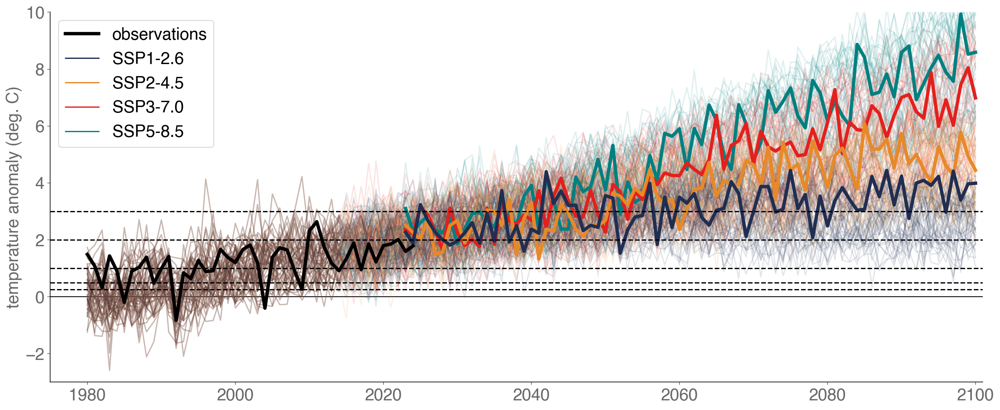

In [51]:
# Paper Figure 1

colors = {
    "ssp119": "#39a3c6",
    "ssp126": "#202e52",
    "ssp245": "#e78928",
    "ssp370": "#E4201D",
    "ssp585": "#008080",
    "obs": "k",
    "obs_pred": "deeppink",
}

plt.figure(figsize=(20, 8))

plt.axhline(y=0, color="k", linewidth=1.0)

for ssp in np.unique(data.d_train["ssp"])[::-1]:
    for gcm in np.unique(data.d_train["gcm_name"]):
        for mem in range(10):
            for d in (data.d_train, data.d_val, data.d_test):
                i = np.where(
                    (d["ssp"] == ssp) & (d["gcm_name"] == gcm) & (d["member"] == mem)
                )[0]
                plt.plot(
                    d["year"][i][
                        :121
                    ],  # data loops so need to only plot 1 line for each or else it will wrap around
                    d["current_temp"][i][:121],
                    "-",
                    color=colors[ssp],
                    linewidth=1.5,
                    alpha=0.12,
                )

for ssp in np.unique(data.d_train["ssp"])[::-1]:
    for gcm in np.unique(data.d_train["gcm_name"][0]):
        for mem in np.arange(1, 2):
            for d in (data.d_train, data.d_val, data.d_test):
                i = np.where(
                    (d["ssp"] == ssp) & (d["gcm_name"] == gcm) & (d["member"] == mem)
                )[0]
                plt.plot(
                    d["year"][i][
                        43:121
                    ],  # data loops so need to only plot 1 line for each or else it will wrap around
                    d["current_temp"][i][43:121],
                    "-",
                    color=colors[ssp],
                    linewidth=4.0,
                    alpha=1.0,
                )

plt.plot(
    data.d_obs["year"][0:45],
    data.d_obs["current_temp"][0:45],
    color=colors["obs"],
    label="observations",
    linewidth=4.0,
)
# #plt.plot(100, 100, "-", label="SSP1-1.9", color=colors["ssp119"])
plt.plot(100, 100, "-", label="SSP1-2.6", color=colors["ssp126"])
plt.plot(100, 100, "-", label="SSP2-4.5", color=colors["ssp245"])
plt.plot(100, 100, "-", label="SSP3-7.0", color=colors["ssp370"])
plt.plot(100, 100, "-", label="SSP5-8.5", color=colors["ssp585"])

plt.legend(fontsize=20, frameon=True)

plt.axhline(y=0.25, linestyle="--", color="black")
plt.axhline(y=0.5, linestyle="--", color="black")
plt.axhline(y=1.0, linestyle="--", color="black")
plt.axhline(y=2.0, linestyle="--", color="black")
plt.axhline(y=3.0, linestyle="--", color="black")

plt.xlim(1975, 2101)
plt.ylim(-3.0, 10)
plt.gca().spines[["right", "top"]].set_visible(False)
plt.ylabel("temperature anomaly (deg. C)", fontsize=20)
plt.yticks(np.arange(-2, 11, 2), fontsize=20)
plt.xticks(fontsize=20)
plt.show()